<a href="https://colab.research.google.com/github/lifesboy/selks-lstm-data/blob/main/SELKS_LSTM_Anomaly_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1.LSTM KERAS

docs lib: https://keras.io/api/layers/recurrent_layers/lstm/

# 2.PREPARATION

In [1]:
#@title Check version vs GPU
!git --version
!python --version
!ray --version

import tensorflow as tf
print('tf version: ', tf.__version__)
print('tf.keras version:', tf.keras.__version__)

import sys
sys.version

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print('GPU device not found')
else:
  print('Found GPU at: {}'.format(device_name))

git version 2.20.1
Python 2.7.16
ray, version 1.13.0
tf version:  2.7.0
tf.keras version: 2.7.0
Found GPU at: /device:GPU:0


2023-01-29 14:44:55.154294: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-01-29 14:44:57.649890: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:0 with 11478 MB memory:  -> device: 0, name: NVIDIA A16, pci bus id: 0000:3f:00.0, compute capability: 8.6
2023-01-29 14:44:57.651086: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:1 with 12910 MB memory:  -> device: 1, name: NVIDIA A16, pci bus id: 0000:40:00.0, compute capability: 8.6
2023-01-29 14:44:57.652298: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:2 with 12910 MB memory:  -> device: 2, name: NVIDIA A16, pci bus id: 0000:41:00.0, compute capabilit

In [2]:
#@title Import Libraries
!mkdir -p /cic/images/

import sys
sys.path.insert(0, "/usr/local/opnsense/scripts/ml")

import json
import ray
import pyarrow
import pyarrow as pa
from pyarrow import csv
from pandas import DataFrame

from ray.data import Dataset
from ray.data.aggregate import Count

import numpy as np
from numpy import array
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import LSTM, Bidirectional
from tensorflow.keras import Input


import common
from anomaly_normalization import PS, LABEL, PAYLOAD_FEATURE_NUM, ALL_FEATURES
from aimodels.preprocessing.cicflowmeter_norm_model import CicFlowmeterNormModel
from aitests.testutils import show_scattered_4d, show_weights, show_4d_imgs, show_train_metric, IMG,\
read_csv_in_dir, read_csv_in_dir_label_string

run, client = common.init_experiment(name='notebook')


2023-01-29 14:45:00,470[INFO][140277802493760-MainThread] worker.py:init(957) Connecting to existing Ray cluster at address: 172.18.12.180:6379


# 3.INPUT
Let's generate a sample input with time dimension as below:

In [3]:
#@title Generate an input sequence
#10.0.2.10
#10.0.2.155
#10.0.2.180
#10.0.2.181
#10.0.2.182
#192.168.66.39
#192.168.66.21

cell_size = 320 #@param {type:"integer"} #numberOfLSTMunits
hidden_size = 230 #@param {type:"integer"}
n_timesteps_in = 100  #@param {type:"integer"}
n_features = 79   #@param {type:"integer"}

# generate datasets
train_size= 41 #@param {type:"integer"}
test_size = 40  #@param {type:"integer"}
batch_size=32 #@param {type:"integer"}
epochs=100 #@param {type:"integer"}

L_fsource = '/cic/dataset/featured_extracted/ftp-bruteforce-forward-https-label/' #@param {type:"string"}
L_fdata: Dataset = read_csv_in_dir_label_string(L_fsource)
L_fcount: DataFrame = L_fdata.groupby(LABEL).aggregate(Count()).to_pandas()

features = ['ack_flag_cnt', 'active_max', 'active_mean', 'active_min', 'active_std', 'bwd_blk_rate_avg', 'bwd_byts_b_avg', 'bwd_header_len', 'bwd_iat_max', 'bwd_iat_mean', 'bwd_iat_min', 'bwd_iat_std', 'bwd_iat_tot', 'bwd_pkt_len_max', 'bwd_pkt_len_mean', 'bwd_pkt_len_min', 'bwd_pkt_len_std', 'bwd_pkts_b_avg', 'bwd_pkts_s', 'bwd_psh_flags', 'bwd_seg_size_avg', 'bwd_urg_flags', 'cwe_flag_count', 'down_up_ratio', 'dst_port', 'ece_flag_cnt', 'fin_flag_cnt', 'flow_byts_s', 'flow_duration', 'flow_iat_max', 'flow_iat_mean', 'flow_iat_min', 'flow_iat_std', 'flow_pkts_s', 'fwd_act_data_pkts', 'fwd_blk_rate_avg', 'fwd_byts_b_avg', 'fwd_header_len', 'fwd_iat_max', 'fwd_iat_mean', 'fwd_iat_min', 'fwd_iat_std', 'fwd_iat_tot', 'fwd_pkt_len_max', 'fwd_pkt_len_mean', 'fwd_pkt_len_min', 'fwd_pkt_len_std', 'fwd_pkts_b_avg', 'fwd_pkts_s', 'fwd_psh_flags', 'fwd_seg_size_avg', 'fwd_seg_size_min', 'fwd_urg_flags', 'idle_max', 'idle_mean', 'idle_min', 'idle_std', 'init_bwd_win_byts', 'init_fwd_win_byts', 'pkt_len_max', 'pkt_len_mean', 'pkt_len_min', 'pkt_len_std', 'pkt_len_var', 'pkt_size_avg', 'protocol', 'psh_flag_cnt', 'rst_flag_cnt', 'src_port', 'subflow_bwd_byts', 'subflow_bwd_pkts', 'subflow_fwd_byts', 'subflow_fwd_pkts', 'syn_flag_cnt', 'tot_bwd_pkts', 'tot_fwd_pkts', 'totlen_bwd_pkts', 'totlen_fwd_pkts', 'urg_flag_cnt']
#features = [*features, *[PS % i for i in range(0, PAYLOAD_FEATURE_NUM)]]
features = features[0: n_features]
Lfpadding_features = sorted(list(set(features) - set(L_fdata.schema(fetch_if_missing=True).names)))

print ('features=', features)
print ('Lfpadding_features=', Lfpadding_features)

L_ftrain = DataFrame.from_records(L_fdata.take(train_size * n_timesteps_in)).fillna(0).replace([np.inf, -np.inf], 0)
L_ftrain[Lfpadding_features] = 0
#L_ftrain[LABEL] = L_ftrain.apply(lambda x: 'Anomaly' if x['src_ip'] == '192.168.66.39' else 'Benign', axis=1)
L_ftrain[LABEL] = L_ftrain[LABEL].apply(lambda x: 0 if x in ['Benign', ''] else 1)
LX_ftrain = L_ftrain[features].to_numpy().reshape(train_size, n_timesteps_in, n_features)
Ly_ftrain = L_ftrain[[LABEL]].to_numpy().reshape(train_size, n_timesteps_in)

L_ftest = DataFrame.from_records(L_fdata.take(test_size * n_timesteps_in)).fillna(0).replace([np.inf, -np.inf], 0)
L_ftest[Lfpadding_features] = 0
#L_ftest[LABEL] = L_ftest.apply(lambda x: 'Anomaly' if x['src_ip'] == '192.168.66.39' else 'Benign', axis=1)
L_ftest[LABEL] = L_ftest[LABEL].apply(lambda x: 0 if x in ['Benign', ''] else 1)
LX_ftest = L_ftest[features].to_numpy().reshape(test_size, n_timesteps_in, n_features)
Ly_ftest = L_ftest[[LABEL]].to_numpy().reshape(test_size, n_timesteps_in)

Shuffle Reduce: 100%|██████████| 1/1 [00:00<00:00, 73.85it/s]


features= ['ack_flag_cnt', 'active_max', 'active_mean', 'active_min', 'active_std', 'bwd_blk_rate_avg', 'bwd_byts_b_avg', 'bwd_header_len', 'bwd_iat_max', 'bwd_iat_mean', 'bwd_iat_min', 'bwd_iat_std', 'bwd_iat_tot', 'bwd_pkt_len_max', 'bwd_pkt_len_mean', 'bwd_pkt_len_min', 'bwd_pkt_len_std', 'bwd_pkts_b_avg', 'bwd_pkts_s', 'bwd_psh_flags', 'bwd_seg_size_avg', 'bwd_urg_flags', 'cwe_flag_count', 'down_up_ratio', 'dst_port', 'ece_flag_cnt', 'fin_flag_cnt', 'flow_byts_s', 'flow_duration', 'flow_iat_max', 'flow_iat_mean', 'flow_iat_min', 'flow_iat_std', 'flow_pkts_s', 'fwd_act_data_pkts', 'fwd_blk_rate_avg', 'fwd_byts_b_avg', 'fwd_header_len', 'fwd_iat_max', 'fwd_iat_mean', 'fwd_iat_min', 'fwd_iat_std', 'fwd_iat_tot', 'fwd_pkt_len_max', 'fwd_pkt_len_mean', 'fwd_pkt_len_min', 'fwd_pkt_len_std', 'fwd_pkts_b_avg', 'fwd_pkts_s', 'fwd_psh_flags', 'fwd_seg_size_avg', 'fwd_seg_size_min', 'fwd_urg_flags', 'idle_max', 'idle_mean', 'idle_min', 'idle_std', 'init_bwd_win_byts', 'init_fwd_win_byts', 'pk

In [4]:
L_fcount

,label,count()
0,,8068
1,FTP-Bruteforce,181


## Data preview

### L_ftrain preview

In [5]:
L_ftrain[[LABEL, *features]]

,label,ack_flag_cnt,active_max,active_mean,active_min,active_std,bwd_blk_rate_avg,bwd_byts_b_avg,bwd_header_len,bwd_iat_max,bwd_iat_mean,bwd_iat_min,bwd_iat_std,bwd_iat_tot,bwd_pkt_len_max,bwd_pkt_len_mean,bwd_pkt_len_min,bwd_pkt_len_std,bwd_pkts_b_avg,bwd_pkts_s,bwd_psh_flags,bwd_seg_size_avg,bwd_urg_flags,cwe_flag_count,down_up_ratio,dst_port,ece_flag_cnt,fin_flag_cnt,flow_byts_s,flow_duration,flow_iat_max,flow_iat_mean,flow_iat_min,flow_iat_std,flow_pkts_s,fwd_act_data_pkts,fwd_blk_rate_avg,fwd_byts_b_avg,fwd_header_len,fwd_iat_max,fwd_iat_mean,fwd_iat_min,fwd_iat_std,fwd_iat_tot,fwd_pkt_len_max,fwd_pkt_len_mean,fwd_pkt_len_min,fwd_pkt_len_std,fwd_pkts_b_avg,fwd_pkts_s,fwd_psh_flags,fwd_seg_size_avg,fwd_seg_size_min,fwd_urg_flags,idle_max,idle_mean,idle_min,idle_std,init_bwd_win_byts,init_fwd_win_byts,pkt_len_max,pkt_len_mean,pkt_len_min,pkt_len_std,pkt_len_var,pkt_size_avg,protocol,psh_flag_cnt,rst_flag_cnt,src_port,subflow_bwd_byts,subflow_bwd_pkts,subflow_fwd_byts,subflow_fwd_pkts,syn_flag_cnt,tot_bwd_pkts,tot_fwd_pkts,totlen_bwd_pkts,totlen_fwd_pkts,urg_flag_cnt
0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,9200.0,0.0,1.0,831021.613960,1122469.0,879348.0,46769.541667,5.0,174668.051368,22.272330,21.0,8.391750e+05,931496.0,500.0,879348.0,46769.541667,5.0,174668.051368,1122469.0,65531.0,37311.840000,52.0,29200.155447,21.0,22.272330,0.0,37311.840000,20.0,0.0,0.0,0.0,0.0,0.0,0.0,512.0,65531.0,37311.840000,52.0,29200.155447,8.526491e+08,37311.840000,6.0,0.0,0.0,37198.0,0.0,0.0,932796.0,25.0,0.0,0.0,25.0,0.0,932796.0,0.0
1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,857779.0,295726.25,42760.0,326982.061611,1182905.0,520.0,472.4,282.0,95.2,0.0,4.078590,0.0,472.4,0.0,0.0,0.555556,443.0,0.0,1.0,3455.381046,1225914.0,814999.0,94301.076923,1949.0,210534.020661,11.420051,5.0,0.000000e+00,0.0,180.0,814999.0,153239.250000,42029.0,251213.507294,1225914.0,393.0,208.222222,40.0,154.502627,0.0,7.341461,0.0,208.222222,20.0,0.0,0.0,0.0,0.0,0.0,659.0,1022.0,520.0,302.571429,40.0,186.026002,3.460567e+04,302.571429,6.0,0.0,0.0,61623.0,2362.0,5.0,1874.0,9.0,0.0,5.0,9.0,2362.0,1874.0,0.0
2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,9200.0,0.0,1.0,593750.822557,1063756.0,923736.0,62573.882353,5.0,216244.316404,16.921174,14.0,1.427113e+07,586572.0,360.0,923736.0,62573.882353,5.0,216244.316404,1063756.0,65531.0,35089.222222,52.0,29865.803744,12.0,16.921174,0.0,35089.222222,20.0,0.0,0.0,0.0,0.0,0.0,0.0,512.0,65531.0,35089.222222,52.0,29865.803744,8.919662e+08,35089.222222,6.0,0.0,0.0,50510.0,0.0,0.0,631606.0,18.0,0.0,0.0,18.0,0.0,631606.0,0.0
3,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,9200.0,0.0,1.0,2084.170976,1002317.0,998530.0,334105.666667,1833.0,469818.954282,3.990753,2.0,0.000000e+00,0.0,80.0,998530.0,334105.666667,1833.0,469818.954282,1002317.0,996.0,522.250000,52.0,470.256512,0.0,3.990753,0.0,522.250000,20.0,0.0,0.0,0.0,0.0,0.0,0.0,6149.0,996.0,522.250000,52.0,470.256512,2.211412e+05,522.250000,6.0,0.0,0.0,34560.0,0.0,0.0,2089.0,4.0,0.0,0.0,4.0,0.0,2089.0,0.0
4,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20.0,0.0,0.00,0.0,0.000000,0.0,40.0,40.0,40.0,0.0,0.0,1310.615990,0.0,40.0,0.0,0.0,1.000000,58370.0,0.0,1.0,120576.671035,763.0,0.0,0.000000,0.0,0.000000,2621.231979,0.0,0.000000e+00,0.0,20.0,0.0,0.000000,0.0,0.000000,0.0,52.0,52.000000,52.0,0.000000,0.0,1310.615990,0.0,52.000000,20.0,0.0,0.0,0.0,0.0,0.0,0.0,512.0,52.0,46.000000,40.0,6.000000,3.600000e+01,46.000000,6.0,0.0,0.0,9200.0,40.0,1.0,52.0,1.0,0.0,1.0,1.0,40.0,52.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4095,0,0

In [6]:
L_ftrain[[LABEL, *features]].describe()

,label,ack_flag_cnt,active_max,active_mean,active_min,active_std,bwd_blk_rate_avg,bwd_byts_b_avg,bwd_header_len,bwd_iat_max,bwd_iat_mean,bwd_iat_min,bwd_iat_std,bwd_iat_tot,bwd_pkt_len_max,bwd_pkt_len_mean,bwd_pkt_len_min,bwd_pkt_len_std,bwd_pkts_b_avg,bwd_pkts_s,bwd_psh_flags,bwd_seg_size_avg,bwd_urg_flags,cwe_flag_count,down_up_ratio,dst_port,ece_flag_cnt,fin_flag_cnt,flow_byts_s,flow_duration,flow_iat_max,flow_iat_mean,flow_iat_min,flow_iat_std,flow_pkts_s,fwd_act_data_pkts,fwd_blk_rate_avg,fwd_byts_b_avg,fwd_header_len,fwd_iat_max,fwd_iat_mean,fwd_iat_min,fwd_iat_std,fwd_iat_tot,fwd_pkt_len_max,fwd_pkt_len_mean,fwd_pkt_len_min,fwd_pkt_len_std,fwd_pkts_b_avg,fwd_pkts_s,fwd_psh_flags,fwd_seg_size_avg,fwd_seg_size_min,fwd_urg_flags,idle_max,idle_mean,idle_min,idle_std,init_bwd_win_byts,init_fwd_win_byts,pkt_len_max,pkt_len_mean,pkt_len_min,pkt_len_std,pkt_len_var,pkt_size_avg,protocol,psh_flag_cnt,rst_flag_cnt,src_port,subflow_bwd_byts,subflow_bwd_pkts,subflow_fwd_byts,subflow_fwd_pkts,syn_flag_cnt,tot_bwd_pkts,tot_fwd_pkts,totlen_bwd_pkts,totlen_fwd_pkts,urg_flag_cnt
count,4100.000000,4100.0,4.100000e+03,4.100000e+03,4.100000e+03,4.100000e+03,4.100000e+03,4100.000000,4100.000000,4.100000e+03,4.100000e+03,4.100000e+03,4.100000e+03,4.100000e+03,4100.000000,4100.000000,4100.000000,4100.000000,4100.000000,4100.000000,4100.0,4100.000000,4100.0,4100.0,4100.000000,4100.000000,4100.0,4100.000000,4.100000e+03,4.100000e+03,4.100000e+03,4.100000e+03,4.100000e+03,4.100000e+03,4100.000000,4100.000000,4.100000e+03,4.100000e+03,4100.000000,4.100000e+03,4.100000e+03,4.100000e+03,4.100000e+03,4.100000e+03,4100.000000,4100.000000,4100.000000,4100.000000,4100.000000,4100.000000,4100.0,4100.000000,4100.000000,4100.0,4.100000e+03,4.100000e+03,4.100000e+03,4.100000e+03,4100.000000,4100.000000,4100.000000,4100.000000,4100.000000,4100.000000,4.100000e+03,4100.000000,4100.000000,4100.0,4100.0,4100.000000,4.100000e+03,4100.000000,4.100000e+03,4100.00000,4100.0,4100.000000,4100.00000,4.100000e+03,4.100000e+03,4100.0
mean,0.044146,0.0,1.138876e+05,8.246315e+04,5.335627e+04,2.631646e+04,3.250498e+05,566.191552,149.826341,1.037194e+06,2.232048e+05,3.338436e+04,3.031763e+05,2.750922e+06,161.315122,109.432905,77.897805,30.591685,0.505824,162.535855,0.0,109.432905,0.0,0.0,0.963628,1674.410488,0.0,0.230000,4.324293e+04,4.749239e+06,1.545271e+06,2.678674e+05,6.251979e+03,4.660585e+05,340.571466,6.620732,9.363455e+04,7.773885e+03,191.079024,1.231615e+06,2.672540e+05,1.674431e+04,3.991989e+05,4.339139e+06,1133.076829,428.216917,58.829024,364.284744,0.421183,178.035611,0.0,428.216917,10.760000,0.0,6.020415e+05,3.421165e+05,9.721845e+04,2.197429e+05,489.037805,5583.573171,1195.568293,451.650769,58.771951,390.437467,7.028311e+06,451.650769,14.470000,0.0,0.0,55116.763415,5.363246e+03,7.962683,2.982928e+04,10.02561,0.0,7.962683,10.02561,5.363246e+03,2.982928e+04,0.0
std,0.205445,0.0,1.056060e+06,8.371245e+05,7.041904e+05,2.782024e+05,2.285393e+06,6062.783899,1435.719951,3.515394e+06,1.023471e+06,5.405367e+05,1.056273e+06,1.083042e+07,290.880879,139.593633,40.286139,112.005014,4.535830,472.430164,0.0,139.593633,0.0,0.0,0.378618,7660.340159,0.0,0.420884,4.385941e+05,1.422889e+07,4.613185e+06,1.150428e+06,1.785317e+05,1.645215e+06,1155.788561,73.294703,2.622175e+06,1.163566e+05,1708.019155,3.821335e+06,1.001317e+06,3.639393e+05,1.310832e+06,1.397971e+07,7595.641428,3268.815751,10.135303,2624.339439,4.700166,834.606650,0.0,3268.815751,5.050606,0.0,2.318093e+06,1.379223e+06,6.549300e+05,8.851052e+05,4671.665970,16794.109327,7591.054293,3267.242381,10.112490,2622.507759,6.415044e+07,3267.242381,4.629722,0.0,0.0,9993.593933,7.690012e+04,71.740022,2.511214e+05,85.35089,0.0,71.740022,85.35089,7.690012e+04,2.511214e+05,0.0
min,0.000000,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,21.00000

In [7]:
DataFrame.from_records(LX_ftrain[0])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78
0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.000000e+00,0.0,0.000000e+00,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,9200.0,0.0,1.0,831021.613960,1122469.0,879348.0,4.676954e+04,5.0,1.746681e+05,22.272330,21.0,8.391750e+05,931496.0,500.0,879348.0,4.676954e+04,5.0,1.746681e+05,1122469.0,65531.0,37311.840000,52.0,29200.155447,21.0,22.272330,0.0,37311.840000,20.0,0.0,0.0,0.0,0.0,0.0,0.0,512.0,65531.0,37311.840000,52.0,29200.155447,8.526491e+08,37311.840000,6.0,0.0,0.0,37198.0,0.0,0.0,932796.0,25.0,0.0,0.0,25.0,0.0,932796.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,100.0,857779.0,2.957262e+05,42760.0,3.269821e+05,1182905.0,520.0,472.400000,282.0,95.200000,0.0,4.078590,0.0,472.400000,0.0,0.0,0.555556,443.0,0.0,1.0,3455.381046,1225914.0,814999.0,9.430108e+04,1949.0,2.105340e+05,11.420051,5.0,0.000000e+00,0.0,180.0,814999.0,1.532392e+05,42029.0,2.512135e+05,1225914.0,393.0,208.222222,40.0,154.502627,0.0,7.341461,0.0,208.222222,20.0,0.0,0.0,0.0,0.0,0.0,659.0,1022.0,520.0,302.571429,40.0,186.026002,3.460567e+04,302.571429,6.0,0.0,0.0,61623.0,2362.0,5.0,1874.0,9.0,0.0,5.0,9.0,2362.0,1874.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.000000e+00,0.0,0.000000e+00,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,9200.0,0.0,1.0,593750.822557,1063756.0,923736.0,6.257388e+04,5.0,2.162443e+05,16.921174,14.0,1.427113e+07,586572.0,360.0,923736.0,6.257388e+04,5.0,2.162443e+05,1063756.0,65531.0,35089.222222,52.0,29865.803744,12.0,16.921174,0.0,35089.222222,20.0,0.0,0.0,0.0,0.0,0.0,0.0,512.0,65531.0,35089.222222,52.0,29865.803744,8.919662e+08,35089.222222,6.0,0.0,0.0,50510.0,0.0,0.0,631606.0,18.0,0.0,0.0,18.0,0.0,631606.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.000000e+00,0.0,0.000000e+00,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,9200.0,0.0,1.0,2084.170976,1002317.0,998530.0,3.341057e+05,1833.0,4.698190e+05,3.990753,2.0,0.000000e+00,0.0,80.0,998530.0,3.341057e+05,1833.0,4.698190e+05,1002317.0,996.0,522.250000,52.0,470.256512,0.0,3.990753,0.0,522.250000,20.0,0.0,0.0,0.0,0.0,0.0,0.0,6149.0,996.0,522.250000,52.0,470.256512,2.211412e+05,522.250000,6.0,0.0,0.0,34560.0,0.0,0.0,2089.0,4.0,0.0,0.0,4.0,0.0,2089.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,20.0,0.0,0.000000e+00,0.0,0.000000e+00,0.0,40.0,40.000000,40.0,0.000000,0.0,1310.615990,0.0,40.000000,0.0,0.0,1.000000,58370.0,0.0,1.0,120576.671035,763.0,0.0,0.000000e+00,0.0,0.000000e+00,2621.231979,0.0,0.000000e+00,0.0,20.0,0.0,0.000000e+00,0.0,0.000000e+00,0.0,52.0,52.000000,52.0,0.000000,0.0,1310.615990,0.0,52.000000,20.0,0.0,0.0,0.0,0.0,0.0,0.0,512.0,52.0,46.000000,40.0,6.000000,3.600000e+01,46.000000,6.0,0.0,0.0,9200.0,40.0,1.0,52.0,1.0,0.0,1.0,1.0,40.0,52.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.0,0.0,0.0,0.0,0.0,2.313351e+06,424.5,240.0,16932956.0,1.549785e+06,10.0,4.864611e+06,17047632.0,354.0,110.750000,40.0,85.088312,4.0,0.702460,0.0,110.750000,0.0,0.0,2.000000,443.0,0.0,1.0,107.183621,17082834.0,16897625.0,1.004873e+06,10.0,3.973218e+06,1.053689,4.0,0.000000e+00,0.0,120.0,16937931.0,3.408614e+06,366.0,6.764698e+06,17043072.0,132.0,83.666667,40.0,37.703522,0.0,0.351230,0.0,83.666667,20.0,0.0,0.0,0.0,0.0,0.0,269.0,251.0,354.0,101.722222,40.0,73.915722,5.463534e+03,101.722222,6.0,0.0,0.0,52738.0,1329.0,12.0,502.0,6.0,0.0,12.0,6.0,1329.0,502.0,0.0
96,0.0,0.0,0.0,0.0,0.0,2.160476e+07,4537.0,220.0,243595.0,4.368090e+04,0.0,7.182125e+04,436809.0,1438.0,512.181818,40.0,595.929346,4.0,2

In [8]:
DataFrame.from_records(LX_ftrain[0]).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78
count,100.0,1.000000e+02,1.000000e+02,100.000000,100.000000,1.000000e+02,100.000000,100.000000,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.0,100.000000,100.0,100.0,100.000000,100.000000,100.0,100.0,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,100.000000,100.00000,1.000000e+02,1.000000e+02,100.000000,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.0,100.000000,100.0,100.0,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,1.000000e+02,100.000000,100.0,100.0,100.0,100.000000,100.000000,100.000000,1.000000e+02,100.000000,100.0,100.000000,100.000000,100.000000,1.000000e+02,100.0
mean,0.0,4.062722e+04,2.293858e+04,9619.590000,14285.566049,9.700349e+05,1106.623000,162.400000,2.508821e+06,4.881190e+05,2.432628e+05,5.907903e+05,4.269300e+06,320.170000,137.209040,37.330000,102.239437,1.127000,34.537575,0.0,137.209040,0.0,0.0,0.508579,7647.180000,0.0,1.0,3.672506e+05,1.248412e+07,4.163884e+06,5.754708e+05,2.573677e+04,1.107946e+06,120.613401,17.04000,2.303412e+06,1.383326e+05,552.000000,4.122930e+06,8.042488e+05,3.080576e+04,1.328452e+06,1.219279e+07,13867.940000,5986.804632,47.200000,5224.548013,3.365194,86.075826,0.0,5986.804632,20.0,0.0,1.701788e+06,1.007530e+06,3.832831e+05,6.328815e+05,1828.850000,11015.830000,14021.060000,6026.312070,47.080000,5277.406222,1.218194e+08,6026.312070,6.0,0.0,0.0,48075.440000,3959.720000,8.120000,3.079747e+05,27.600000,0.0,8.120000,27.600000,3959.720000,3.079747e+05,0.0
std,0.0,2.019095e+05,1.302998e+05,86231.301742,73558.444112,4.087919e+06,7282.049739,359.239151,5.299708e+06,1.846771e+06,1.707396e+06,1.309833e+06,8.351914e+06,481.434222,237.088629,74.883756,178.737817,5.452158,163.293183,0.0,237.088629,0.0,0.0,0.628628,12382.976738,0.0,0.0,1.986768e+06,1.215130e+07,5.612552e+06,9.132401e+05,1.444813e+05,1.557164e+06,433.662960,25.28461,1.631110e+07,4.712346e+05,692.400305,5.614798e+06,1.246643e+06,1.479930e+05,1.963491e+06,1.226463e+07,25376.400297,13048.158764,5.908392,9769.755110,9.232002,331.723160,0.0,13048.158764,0.0,0.0,3.623954e+06,2.422085e+06,1.569979e+06,1.385219e+06,9355.576182,18046.293206,25296.041797,13030.582421,5.931733,9742.565933,2.631806e+08,13030.582421,0.0,0.0,0.0,13294.869172,16217.175722,17.961958,7.330875e+05,34.620015,0.0,17.961958,34.620015,16217.175722,7.330875e+05,0.0
min,0.0,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,21.000000,0.0,1.0,7.812526e+00,7.160000e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.150241,0.00000,0.000000e+00,0.000000e+00,20.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,52.000000,42.518519,40.000000,0.000000,0.000000,0.150241,0.0,42.518519,20.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,63.000000,52.000000,46.000000,40.000000,0.000000,0.000000e+00,46.000000,6.0,0.0,0.0,443.000000,0.000000,0.000000,5.200000e+01,1.000000,0.0,0.000000,1.000000,0.000000,5.200000e+01,0.0
25%,0.0,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,443.000000,0.0,1.0,4.954388e+02,4.097600e+05,1.690135e+05,2.391243e+04,3.000000e+00,2.750126e+04,1.468113,2.00000,0.000000e+00,0.000000e+00,100.000000,5.961225e+04,2.274703e+04,4.000000e+00,2.030114e+04,2.068368e+05,151.000000,83.

In [9]:
DataFrame.from_records(Ly_ftrain)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,1,1,1,1,1,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,0,0,0,1,1,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,1,1,1,1,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
37,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
38,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
39,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [10]:
DataFrame.from_records(Ly_ftrain).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
count,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.0,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.0,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.0,41.0,41.0,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.0,41.0,41.0,41.000000
mean,0.024390,0.024390,0.024390,0.024390,0.024390,0.024390,0.073171,0.097561,0.097561,0.048780,0.048780,0.048780,0.048780,0.073171,0.024390,0.0,0.024390,0.024390,0.073171,0.073171,0.024390,0.024390,0.024390,0.024390,0.024390,0.024390,0.024390,0.024390,0.073171,0.073171,0.073171,0.073171,0.073171,0.097561,0.073171,0.048780,0.0,0.024390,0.048780,0.048780,0.048780,0.048780,0.097561,0.097561,0.073171,0.073171,0.048780,0.048780,0.048780,0.024390,0.073171,0.097561,0.048780,0.073171,0.073171,0.097561,0.097561,0.073171,0.048780,0.024390,0.024390,0.024390,0.048780,0.073171,0.024390,0.024390,0.024390,0.048780,0.048780,0.048780,0.048780,0.024390,0.0,0.0,0.0,0.024390,0.024390,0.024390,0.048780,0.073171,0.048780,0.048780,0.048780,0.024390,0.024390,0.024390,0.024390,0.024390,0.024390,0.073171,0.048780,0.048780,0.048780,0.024390,0.048780,0.024390,0.0,0.0,0.0,0.024390
std,0.156174,0.156174,0.156174,0.156174,0.156174,0.156174,0.263652,0.300406,0.300406,0.218085,0.218085,0.218085,0.218085,0.263652,0.156174,0.0,0.156174,0.156174,0.263652,0.263652,0.156174,0.156174,0.156174,0.156174,0.156174,0.156174,0.156174,0.156174,0.263652,0.263652,0.263652,0.263652,0.263652,0.300406,0.263652,0.218085,0.0,0.156174,0.218085,0.218085,0.218085,0.218085,0.300406,0.300406,0.263652,0.263652,0.218085,0.218085,0.218085,0.156174,0.263652,0.300406,0.218085,0.263652,0.263652,0.300406,0.300406,0.263652,0.218085,0.156174,0.156174,0.156174,0.218085,0.263652,0.156174,0.156174,0.156174,0.218085,0.218085,0.218085,0.218085,0.156174,0.0,0.0,0.0,0.156174,0.156174,0.156174,0.218085,0.263652,0.218085,0.218085,0.218085,0.156174,0.156174,0.156174,0.156174,0.156174,0.156174,0.263652,0.218085,0.218085,0.218085,0.156174,0.218085,0.156174,0.0,0.0,0.0,0.156174
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.00000

## Data visualization

In [11]:
#@title create data IMG
IMG['LX_ftrain'], IMG['Ly_ftrain'], IMG['LX_ftest'], IMG['Ly_ftest'] = ray.get([
    show_scattered_4d.remote(LX_ftrain, 'LX_ftrain'),
    show_scattered_4d.remote(Ly_ftrain, 'Ly_ftrain'),
    show_scattered_4d.remote(LX_ftest, 'LX_ftest'),
    show_scattered_4d.remote(Ly_ftest, 'Ly_ftest'),
])

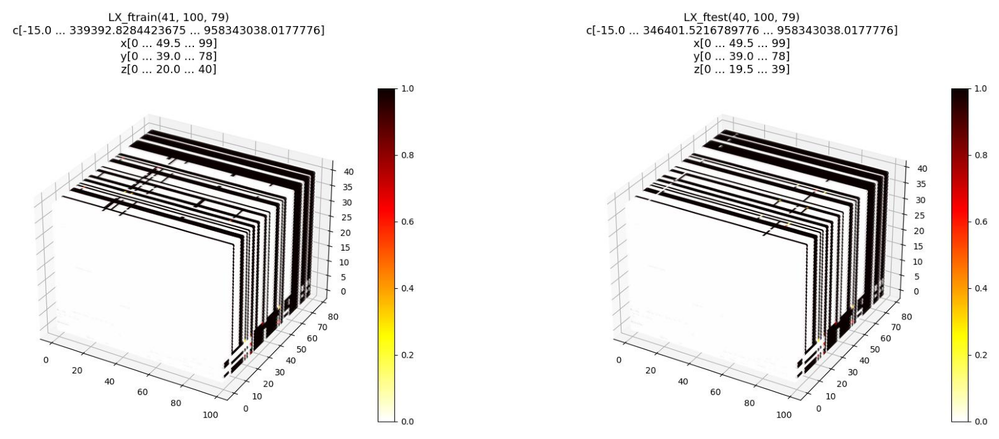

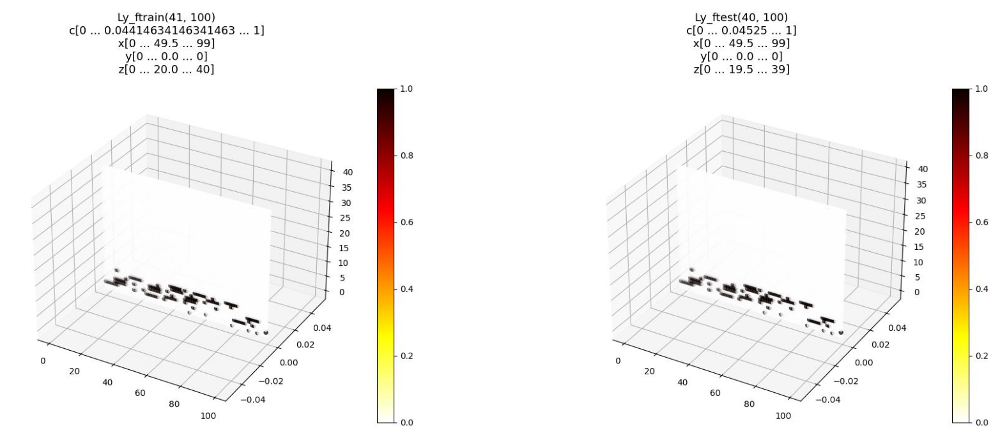

In [12]:
#@title overview featured vs normalized data IMG

show_4d_imgs(['LX_ftrain','LX_ftest'])
show_4d_imgs(['Ly_ftrain','Ly_ftest'])

# 4.INTRODUCTION

To create powerful models, especially for solving Seq2Seq learning problems, LSTM is the key layer.
To use LSTM effectively in models, we need to understand how it generates different results with respect to given parameters.

## 4.1.QUICK RECAP OF LSTM

### 4.1.1.Internal Structure

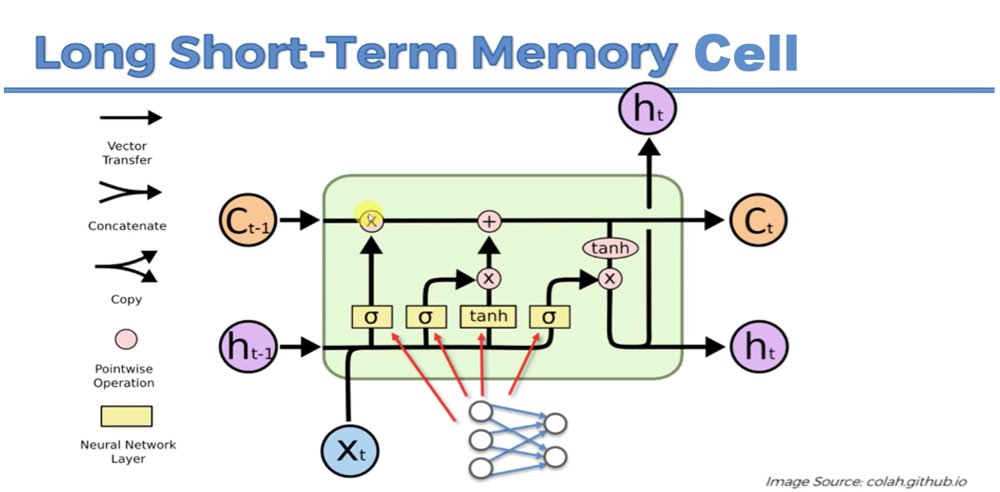

### 4.1.2.Roll-Out Representation of LSTM for each Time Step

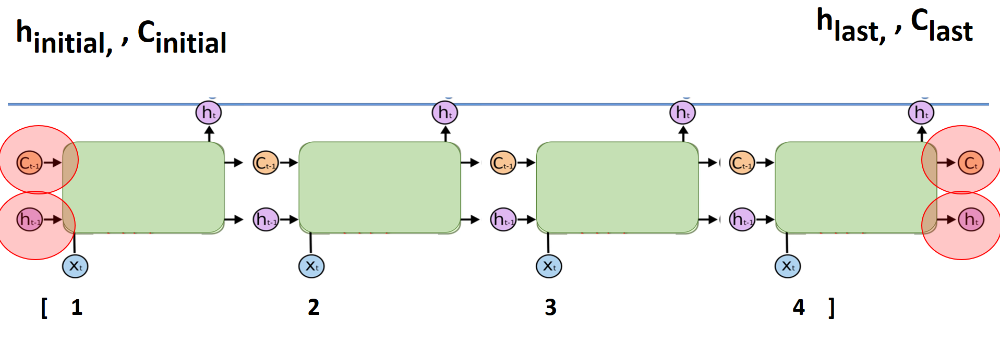

# 5.LSTM Anomaly State management

## 5.1.Model layers



In [13]:
def new_model5():
  num_outputs = 2
  # Define input layers
  input_layer = tf.keras.layers.Input(shape=(None, n_features), name="inputs")
  state_in_h = tf.keras.layers.Input(shape=(cell_size,), name="h")
  state_in_c = tf.keras.layers.Input(shape=(cell_size,), name="c")
  #seq_in = tf.keras.layers.Input(shape=(), name="seq_in", dtype=tf.int32)

  # Preprocess observation with a hidden layer and send to LSTM cell
  dense1 = tf.keras.layers.Dense(hidden_size, activation=tf.keras.activations.linear, name="dense1")(input_layer)
  lstm_out, state_h, state_c = tf.keras.layers.LSTM(
      cell_size, return_sequences=True, return_state=True, name="lstm")(
      inputs=dense1,
      #mask=tf.sequence_mask(seq_in),
      initial_state=[state_in_h, state_in_c]
      )

  # Postprocess LSTM output with another hidden layer and compute values
  logits = tf.keras.layers.Dense(
      num_outputs,
      activation=tf.keras.activations.linear,
      name="logits")(lstm_out)
  values = tf.keras.layers.Dense(
      1, activation="sigmoid", name="values")(lstm_out)

  # Create the RNN model
  model5: Model = Model(
      inputs=
      [
        input_layer,
        #seq_in,
        state_in_h,
        state_in_c
      ],
      outputs=[logits, values, state_h, state_c])
  return model5

model5 = new_model5()
model5.summary()

h = np.zeros((train_size, cell_size), np.float32)
c = np.zeros((train_size, cell_size), np.float32)
IMG['h'], IMG['c'] = ray.get([
    show_scattered_4d.remote(h, "h"),
    show_scattered_4d.remote(c, "c"),
])

2023-01-29 14:45:38.826846: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 11478 MB memory:  -> device: 0, name: NVIDIA A16, pci bus id: 0000:3f:00.0, compute capability: 8.6
2023-01-29 14:45:38.827610: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 12910 MB memory:  -> device: 1, name: NVIDIA A16, pci bus id: 0000:40:00.0, compute capability: 8.6
2023-01-29 14:45:38.828345: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 12910 MB memory:  -> device: 2, name: NVIDIA A16, pci bus id: 0000:41:00.0, compute capability: 8.6
2023-01-29 14:45:38.829078: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:3 with 12910 MB memory:  -> device: 3, name: NVIDIA A16, pci bus id: 0000:42:00.0, compute capability: 8.6


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 inputs (InputLayer)            [(None, None, 79)]   0           []                               
                                                                                                  
 dense1 (Dense)                 (None, None, 230)    18400       ['inputs[0][0]']                 
                                                                                                  
 h (InputLayer)                 [(None, 320)]        0           []                               
                                                                                                  
 c (InputLayer)                 [(None, 320)]        0           []                               
                                                                                              

## 5.2.Train



In [14]:
#@title state function

def train_state(model, x=LX_ftrain, h=h, c=c, y=Ly_ftrain, title=['model5', 'LX_ftrain', 'h', 'c', 'Ly_ftrain']):
  compile = model.predict([x, h, c])
  IMG[f"{title[4]}_predicted"], IMG[f"{title[4]}_h"], IMG[f"{title[4]}_c"] = ray.get([
    show_scattered_4d.remote(compile[1], f"{title[4]}_predicted"),
    show_scattered_4d.remote(compile[2], f"{title[4]}_h"),
    show_scattered_4d.remote(compile[3], f"{title[4]}_c"),
  ])

  show_4d_imgs([title[1], title[4], f"{title[4]}_predicted"])
  show_4d_imgs([title[1], title[2], f"{title[4]}_h"])
  show_4d_imgs([title[1], title[3], f"{title[4]}_c"])

2023-01-29 14:45:41.737477: I tensorflow/stream_executor/cuda/cuda_blas.cc:1774] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-01-29 14:45:42.676065: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8204


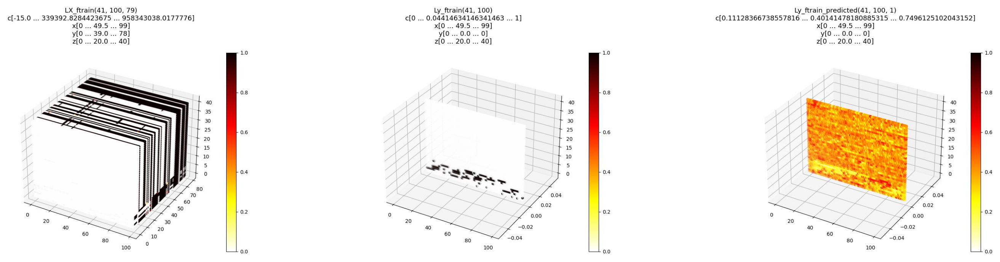

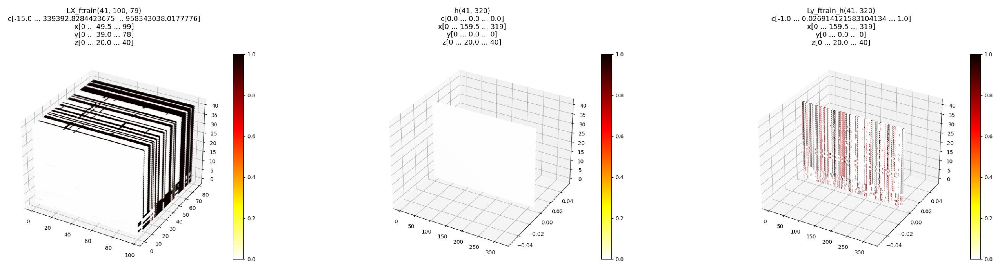

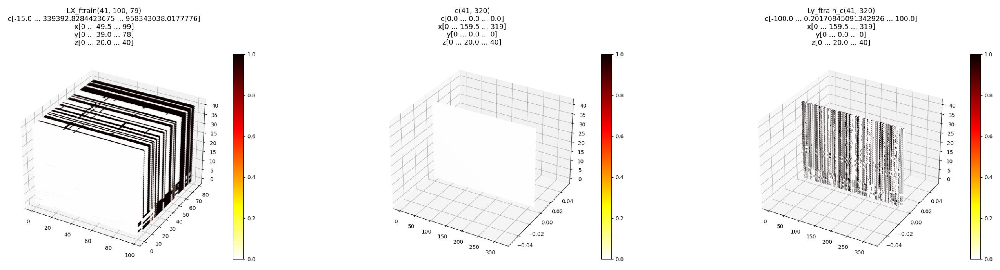

In [15]:
#@title train state

#model5.compile("adam", "binary_crossentropy", metrics=["accuracy"])
train_state(new_model5(), LX_ftrain, h, c, Ly_ftrain, ['model5', 'LX_ftrain', 'h', 'c', 'Ly_ftrain'])

In [16]:
#@title train function
def ftrain(model, name='model'):
  model.compile("adam", "binary_crossentropy", metrics=["accuracy"])
  history = model.fit(LX_ftrain, Ly_ftrain, batch_size=batch_size, epochs=epochs, validation_data=(LX_ftest, Ly_ftest))
  show_train_metric(history, name)
  model.save(f"/usr/local/opnsense/scripts/ml/aicheckpoints/anomaly_flow79_local_ftp/{name}")
  open(f"/usr/local/opnsense/scripts/ml/aicheckpoints/anomaly_flow79_local_ftp/{name}/features.json", "w").write(json.dumps(features))

In [17]:
## 5.3.Infer

In [18]:
#@title infer function

def finfer(name='model', checkpoint='anomaly_flow79_local_ftp'):
  model = keras.models.load_model(f"/usr/local/opnsense/scripts/ml/aicheckpoints/{checkpoint}/{name}")
  ##############LX_ftrain
  L_fresult1=model.predict(LX_ftrain)
  ##############LX_ftest
  L_fresult2=model.predict(LX_ftest)

  IMG['Ly_ftrain_predicted'], IMG['Ly_ftest_predicted'] = ray.get([
    show_scattered_4d.remote(L_fresult1, "Ly_ftrain_predicted"),
    show_scattered_4d.remote(L_fresult2, "Ly_ftest_predicted"),
  ])
  show_4d_imgs(['LX_ftrain','Ly_ftrain','Ly_ftrain_predicted'])
  show_4d_imgs(['LX_ftest','Ly_ftest','Ly_ftest_predicted'])


___

# 6.LSTM Anomaly model (Primary)

## 6.1.Model layers



In [19]:
def new_model6():
  num_outputs = 10
  # Define input layers
  input_layer = tf.keras.layers.Input(shape=(None, n_features), name="inputs")
  #state_in_h = tf.keras.layers.Input(shape=(cell_size,), name="h")
  #state_in_c = tf.keras.layers.Input(shape=(cell_size,), name="c")
  #seq_in = tf.keras.layers.Input(shape=(), name="seq_in", dtype=tf.int32)

  # Preprocess observation with a hidden layer and send to LSTM cell
  #tf.nn.sigmoid
  dense1 = tf.keras.layers.Dense(hidden_size, activation=tf.nn.relu, name="dense1")(input_layer)
  lstm_out, state_h, state_c = tf.keras.layers.LSTM(
      cell_size, return_sequences=True, return_state=True, name="lstm")(
      inputs=dense1,
      #mask=tf.sequence_mask(seq_in),
      #initial_state=[state_in_h, state_in_c]
      )

  # Postprocess LSTM output with another hidden layer and compute values
  logits = tf.keras.layers.Dense(
      num_outputs,
      activation=tf.keras.activations.linear,
      name="logits")(lstm_out)
  values = tf.keras.layers.Dense(
      1, activation="sigmoid", name="values")(lstm_out)

  # Create the RNN model
  model6: Model = Model(
      inputs=input_layer,
      #[
      #  input_layer, #seq_in,
      #  state_in_h,
      #  state_in_c
      #],
      outputs=values
      #[
      #  logits,
      #  values,
      #  state_h,
      #  state_c
      #]
      )
  return model6

model6 = new_model6()
model6.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputs (InputLayer)         [(None, None, 79)]        0         
                                                                 
 dense1 (Dense)              (None, None, 230)         18400     
                                                                 
 lstm (LSTM)                 [(None, None, 320),       705280    
                              (None, 320),                       
                              (None, 320)]                       
                                                                 
 values (Dense)              (None, None, 1)           321       
                                                                 
Total params: 724,001
Trainable params: 724,001
Non-trainable params: 0
_________________________________________________________________


## 6.2.Train



Epoch 1/100
2/2 [==============================] - 2s 550ms/step - loss: 1.2812 - accuracy: 0.2312 - val_loss: 0.3813 - val_accuracy: 0.9410
Epoch 2/100
2/2 [==============================] - 0s 62ms/step - loss: 0.3571 - accuracy: 0.9451 - val_loss: 0.2290 - val_accuracy: 0.9525
Epoch 3/100
2/2 [==============================] - 0s 199ms/step - loss: 0.2179 - accuracy: 0.9537 - val_loss: 0.1831 - val_accuracy: 0.9547
Epoch 4/100
2/2 [==============================] - 0s 113ms/step - loss: 0.1823 - accuracy: 0.9559 - val_loss: 0.1636 - val_accuracy: 0.9547
Epoch 5/100
2/2 [==============================] - 0s 58ms/step - loss: 0.1591 - accuracy: 0.9559 - val_loss: 0.1416 - val_accuracy: 0.9545
Epoch 6/100
2/2 [==============================] - 0s 58ms/step - loss: 0.1413 - accuracy: 0.9556 - val_loss: 0.1480 - val_accuracy: 0.9548
Epoch 7/100
2/2 [==============================] - 0s 61ms/step - loss: 0.1441 - accuracy: 0.9559 - val_loss: 0.1433 - val_accuracy: 0.9548
Epoch 8/100
2/2 [

2023-01-29 14:45:57.854989: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


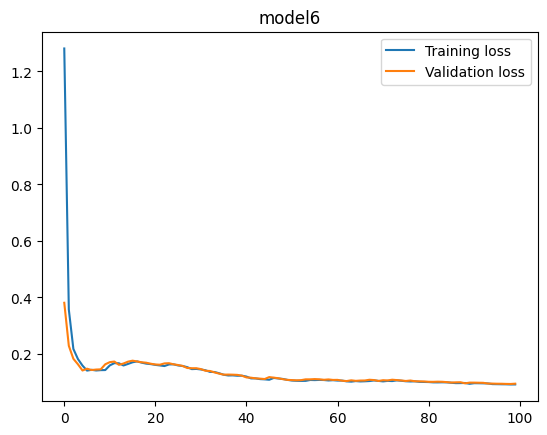

In [20]:
ftrain(model6, 'model6')

## 6.3.Infer



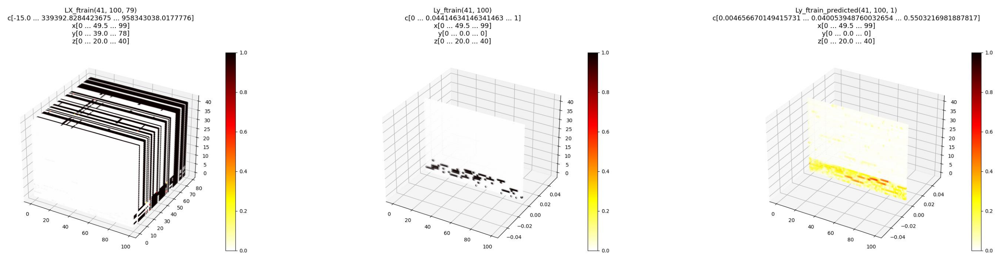

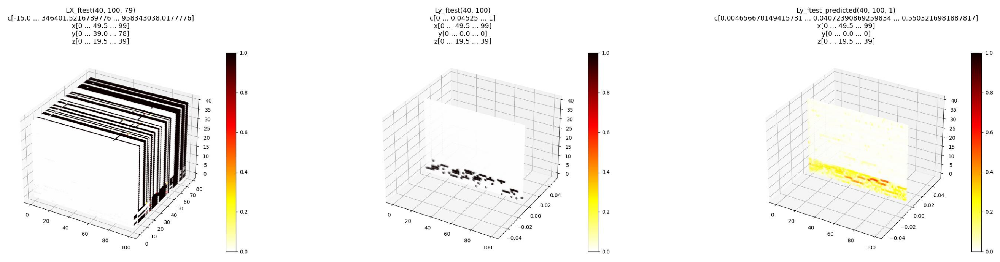

In [21]:
finfer('model6')

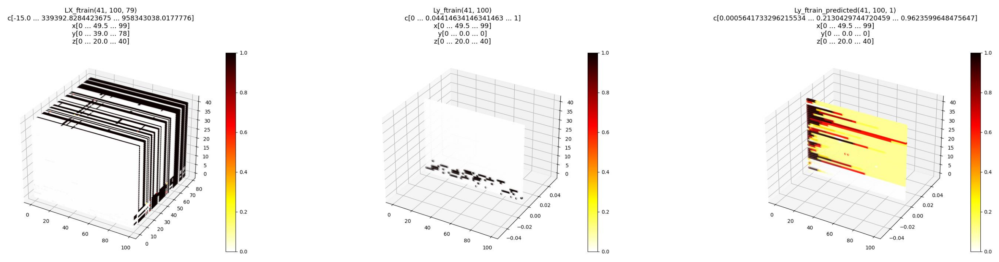

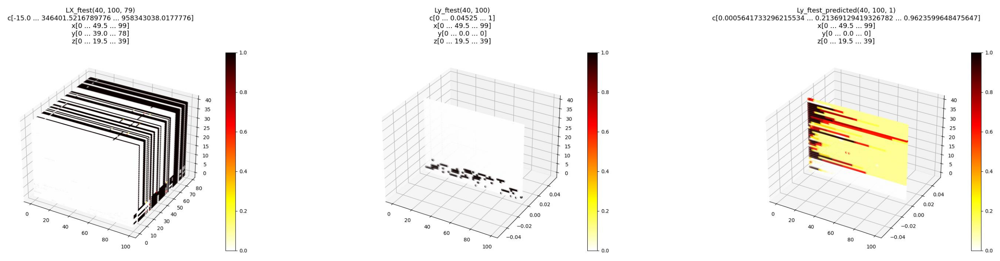

In [22]:
finfer('model6', 'anomaly_flow79_cic_ssh')

# 7.MODEL WEIGHTS SUMMARY

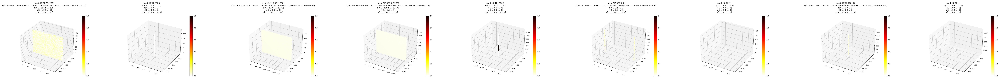

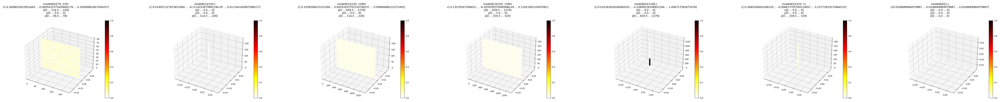

In [23]:
weights5 = show_weights(model5, 'model5')
weights6 = show_weights(model6, 'model6')

show_4d_imgs(weights5)
show_4d_imgs(weights6)